In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from pysal.viz import mapclassify
from tqdm import tqdm_notebook as tqdm

plt.rcParams['figure.figsize'] = 15, 10
%matplotlib inline

# Задачи геоаналитики


- Explorative data analysis
- Spatial clustering/spatial autocorrelation
- Visualization/dashbord

![Image of Yaktocat](https://projects.habidatum.com/img/59e8684d3545c42b570eebce/926721/upload-90b47cc0-e563-11e7-bc69-59fff4834629.jpg)

# Форматы хранения геоданных

- Пространственные данные  (вектор)
    - .shp, .geojson, .json, .kml, .gpkg
    - .txt, .csv, .xls
- Пространственные данные  (растр)
    - .geotiff, .tiff, .jpeg, .asc 

![Image of Yaktocat](http://msp.naturalcapitalproject.org/msp_concierge_master/img/data_formats.png)

## Чтение и базовые операции с геоданными

### Основные библиотеки

In [3]:
import geopandas as gpd
from shapely.geometry import Polygon, Point, MultiLineString
import mapclassify

#### Загружаем административно-территориальное деление Нью-Йорка

In [4]:
nyc = gpd.read_file('data/new-york-city-boroughs.geojson')
nyc.head()

,name,cartodb_id,created_at,updated_at,geometry
0,Staten Island,1,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-74.05050799999999 40.566422, -74.0..."
1,Queens,2,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.83668299999999 40.594947, -73.8..."
2,Brooklyn,3,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.86706100000001 40.582088, -73.8..."
3,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-74.01092800000001 40.684491, -74.0..."
4,Bronx,5,2013-03-09T02:42:03,2013-03-09T02:42:03,"(POLYGON ((-73.896809 40.795808, -73.896939 40..."


In [5]:
nyc.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
name          5 non-null object
cartodb_id    5 non-null int64
created_at    5 non-null object
updated_at    5 non-null object
geometry      5 non-null object
dtypes: int64(1), object(4)
memory usage: 280.0+ bytes


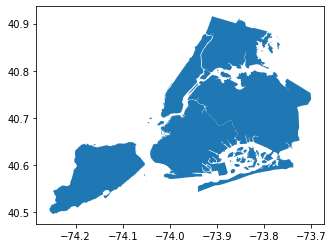

In [6]:
nyc.plot();

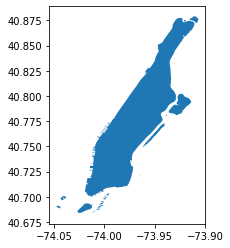

In [7]:
manhattan = nyc[nyc['name'] == 'Manhattan'].reset_index(drop=True)
manhattan.plot();

## Загрузка данных из OSM с помощью overpass-api

![Image of Yaktocat](images/osm_type.png)

[OSM Overpass API](https://wiki.openstreetmap.org/wiki/RU:Overpass_API)

![Image of Yaktocat](https://cdn-images-1.medium.com/max/1600/1*naEo03Ssn3-69xzLZIpZPQ.png)

[Overpass turbo](http://overpass-turbo.eu/)

In [8]:
import overpass

In [9]:
api = overpass.API(endpoint="https://overpass.kumi.systems/api/interpreter")
response = api.get('node["name"="Empire State Building"]')
response

{"features": [{"geometry": {"coordinates": [-73.9849958, 40.7481628], "type": "Point"}, "id": 2709306673, "properties": {"addr:housenumber": "350", "addr:postcode": "10118", "addr:street": "5th Avenue", "name": "Empire State Building", "name:ko": "\uc5e0\ud30c\uc774\uc5b4 \uc2a4\ud14c\uc774\ud2b8 \ube4c\ub529", "opening_hours": "Mo-Su 08:00-02:00", "phone": "2127363100", "tourism": "attraction", "website": "https://www.esbnyc.com/", "wheelchair": "yes"}, "type": "Feature"}, {"geometry": {"coordinates": [16.7553574, 52.2957335], "type": "Point"}, "id": 5552887205, "properties": {"name": "Empire State Building", "tourism": "artwork"}, "type": "Feature"}], "type": "FeatureCollection"}

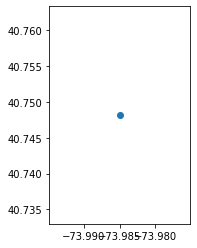

In [10]:
empire_state_building = gpd.GeoDataFrame(geometry=[Point(response[0]['geometry']['coordinates'])], 
                                         crs={'init': 'epsg:4326'})
empire_state_building.plot();

In [11]:
response = api.get('node["name"="Eiffel Tower"]')
eiffel_tower = gpd.GeoDataFrame(geometry=[Point(response[0]['geometry']['coordinates'])], 
                                crs={'init': 'epsg:4326'})

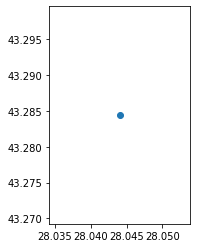

In [12]:
eiffel_tower.plot();

In [13]:
manhattan.contains(empire_state_building)

0    True
dtype: bool

In [14]:
manhattan.contains(eiffel_tower)

0    False
dtype: bool

In [15]:
gpd.sjoin(empire_state_building, nyc)

,geometry,index_right,name,cartodb_id,created_at,updated_at
0,POINT (-73.98499579999999 40.7481628),3,Manhattan,4,2013-03-09T02:42:03,2013-03-09T02:42:03


In [16]:
print(empire_state_building.crs, nyc.crs)

{'init': 'epsg:4326'} {'init': 'epsg:4326'}


## Системы координат

![Image of Yaktocat](https://ours-nature.ru/new_site/img/991345842/i_019.jpg)

![Image of Yaktocat](https://www.syfy.com/sites/syfy/files/wire/legacy/bad_astronomy/lumpy_earth_without_water_0.jpg)

### Москва и разные проекции

![Image of Yaktocat](images/msc_crs.png)

In [17]:
manhattan = manhattan.to_crs(epsg='3857')
empire_state_building = empire_state_building.to_crs(epsg='3857')

In [18]:
empire_state_building

,geometry
0,POINT (-8235972.058798483 4975266.399617112)


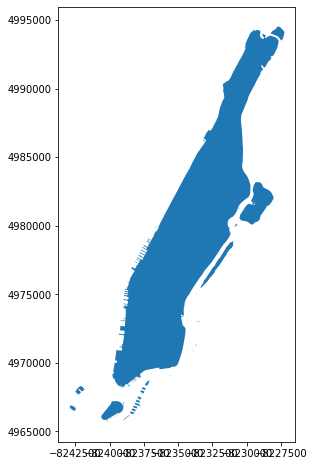

In [19]:
ax = manhattan.plot(figsize=(10, 8))

- [EPSG](https://epsg.io/)
- [Spatial reference list](https://spatialreference.org/ref/epsg/)

## Пространственные операции

#### R-tree for populated places

![Image of Yaktocat](https://cdn-images-1.medium.com/max/2600/1*RsZ300nAnsPCxrd2bu5sQw.png)

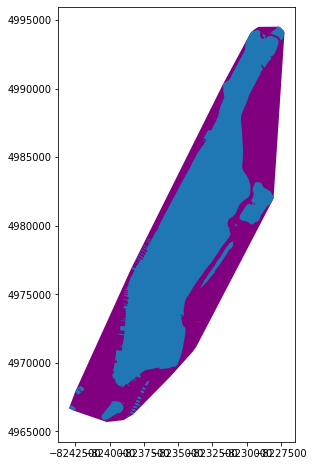

In [20]:
ax = manhattan.convex_hull.plot(color='purple', figsize=(10, 8))
ax = manhattan.plot(ax=ax)

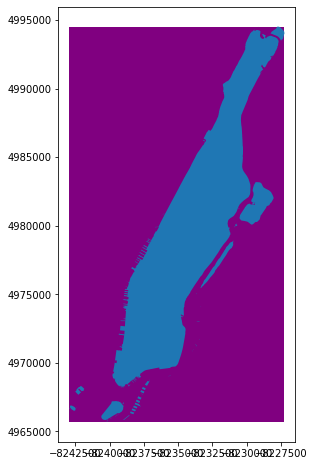

In [21]:
ax = manhattan.envelope.plot(color='purple', figsize=(10, 8))
ax = manhattan.plot(ax=ax)

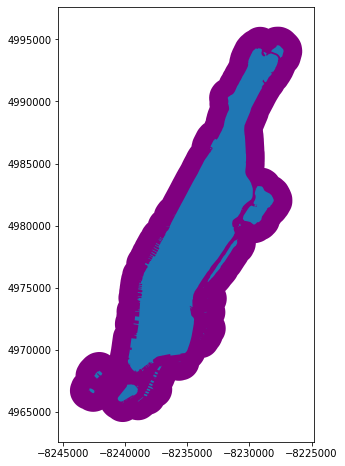

In [22]:
ax = manhattan.buffer(1500).plot(color='purple',  figsize=(10, 8))
ax = manhattan.plot(ax=ax)

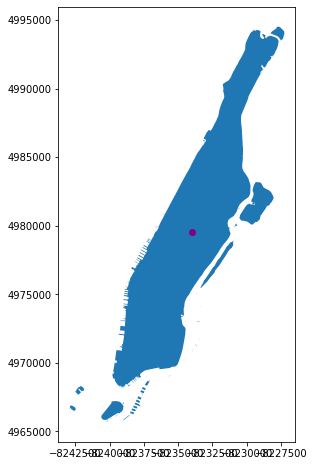

In [23]:
ax = manhattan.plot(figsize=(10, 8))
ax = manhattan.centroid.plot(ax=ax, color='purple')

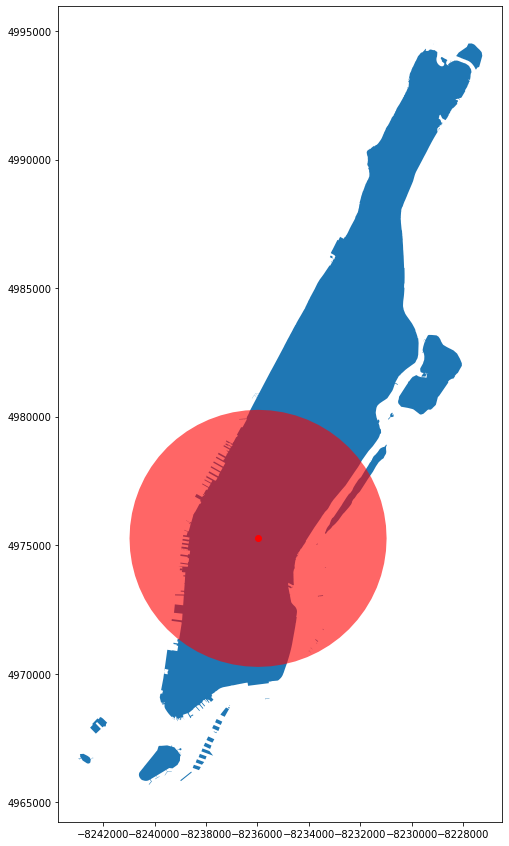

In [24]:
es_buffer = empire_state_building.buffer(5000)

ax = manhattan.plot(figsize=(10, 15))
ax = es_buffer.plot(color='r', ax=ax, alpha=0.6)
ax = empire_state_building.plot(ax=ax, color='r')

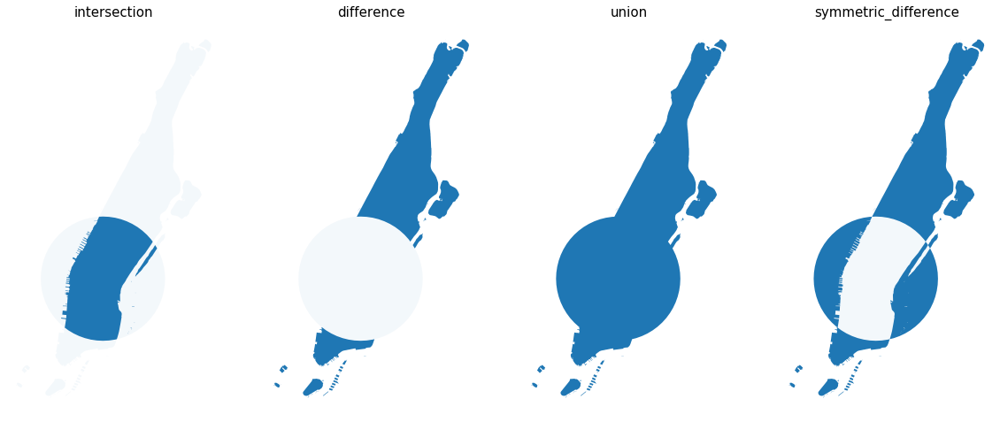

In [25]:
fig, axes = plt.subplots(1, 4, figsize=(20, 20))

polys = [manhattan.intersection(es_buffer),
manhattan.difference(es_buffer),
manhattan.union(es_buffer),
manhattan.symmetric_difference(es_buffer)]

titles = ['intersection', 'difference', 'union', 'symmetric_difference']

for x, ax in enumerate(axes.flatten()):
    ax = manhattan.union(es_buffer).plot(alpha=0.05, ax=ax)
    ax = polys[x].plot(ax=ax)
    ax.set_title(titles[x], size=15)
    ax.axis('off')

plt.show()

In [26]:
manhattan = manhattan.to_crs(epsg='4326')
empire_state_building = empire_state_building.to_crs(epsg='4326')

In [27]:
%%time
df = pd.read_csv('data/train_2015.csv')

CPU times: user 3.65 s, sys: 376 ms, total: 4.03 s
Wall time: 4.44 s


In [28]:
df.head(2)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663


In [29]:
df = df[df['dropoff_longitude'] != 0].reset_index(drop=True)

In [30]:
gdf = df[:500000]
gdf = gpd.GeoDataFrame(gdf,
                       geometry=[Point(x,y) for x,y in zip(gdf['dropoff_longitude'], gdf['dropoff_latitude'])])

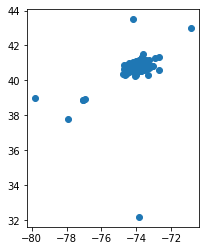

In [31]:
gdf.plot();

In [32]:
lon_min = -74.103095
lat_min = 40.597399
lon_max = -73.729243
lat_max = 40.906114

CPU times: user 18.7 s, sys: 553 ms, total: 19.3 s
Wall time: 22.9 s


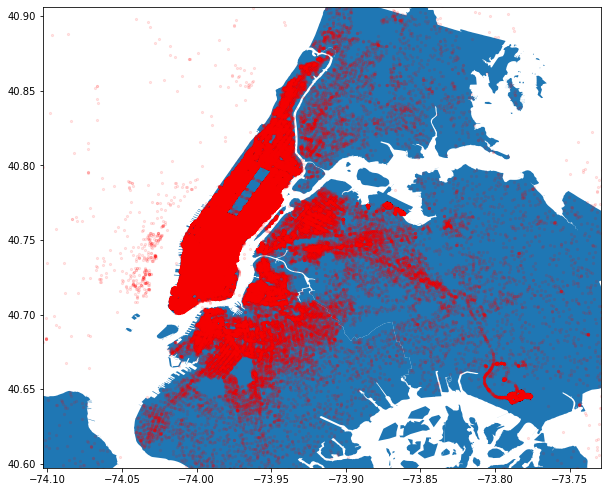

In [33]:
%%time
ax = nyc.plot(figsize=(10, 15))
ax = gdf.plot(ax=ax, color='red', markersize=5, alpha=0.1)
ax.set_xlim((lon_min,lon_max))
ax.set_ylim((lat_min,lat_max))

In [34]:
xy = gdf['geometry'].map(lambda point: point.xy)
x,y = zip(*xy)

CPU times: user 7.06 s, sys: 219 ms, total: 7.28 s
Wall time: 8 s


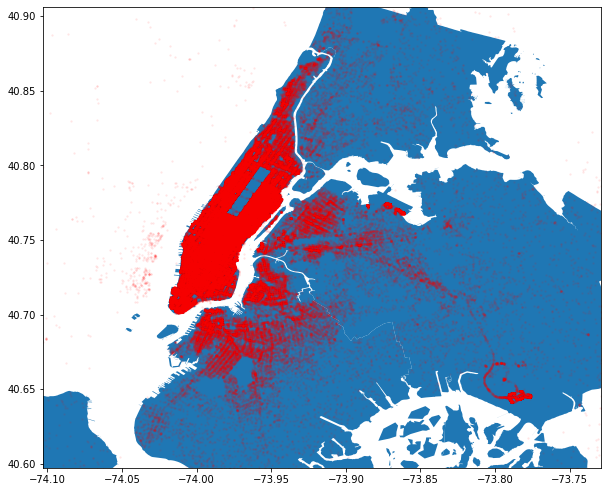

In [35]:
%%time
ax = nyc.plot(figsize=(10, 15))
ax.scatter(x, y, s=5, color='red', linewidth=0, alpha=0.1)
ax.set_xlim((lon_min,lon_max))
ax.set_ylim((lat_min,lat_max))

In [36]:
import folium
from folium.plugins import HeatMap

m = folium.Map(location=[40.730610, -73.935242], 
               zoom_start=12, 
               tiles='cartodbpositron')

df['pickup_latitude'] = df['pickup_latitude'].astype(float)
df['pickup_longitude'] = df['pickup_longitude'].astype(float)

df_for_heatmap = df[['pickup_latitude', 'pickup_longitude']][:20000]

df_for_heatmap = df_for_heatmap.dropna(axis=0, 
                                       subset=['pickup_latitude','pickup_longitude'])

# List comprehension to make out list of lists
heat_data = [[row['pickup_latitude'],row['pickup_longitude']] for index, row in df_for_heatmap.iterrows()]


HeatMap(heat_data,
        radius=10).add_to(m)

m

In [37]:
zones = gpd.read_file('data/taxi_zones.geojson')
zones.head(2)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry
0,1,0.116357,0.000782,Newark Airport,1,EWR,"(POLYGON ((-74.184453 40.6949959999999, -74.18..."
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-73.82337597260664 40.6389870471767...


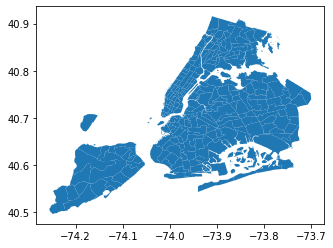

In [38]:
zones.plot();

In [39]:
%%time
df = gpd.GeoDataFrame(df, geometry=[Point(x,y) for x,y in zip(df['dropoff_longitude'], df['dropoff_latitude'])])

CPU times: user 11.7 s, sys: 460 ms, total: 12.2 s
Wall time: 12.5 s


### Spatial Join

In [40]:
%%time
joined = gpd.sjoin(df, zones)

CPU times: user 1min 36s, sys: 4.39 s, total: 1min 40s
Wall time: 1min 44s


In [41]:
%%time
joined = gpd.sjoin(df, zones, op='within')

CPU times: user 57.5 s, sys: 3.82 s, total: 1min 1s
Wall time: 1min 5s


In [42]:
joined.head(3)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry,index_right,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,POINT (-73.96463012695312 40.76560211181641),236,237,0.042213,0.000096,Upper East Side South,237,Manhattan
13,id0799785,2,2016-06-01 20:58:29,2016-06-01 21:02:49,1,-73.956306,40.767941,-73.966110,40.763000,N,260,POINT (-73.96611022949219 40.76300048828125),236,237,0.042213,0.000096,Upper East Side South,237,Manhattan
69,id0913838,2,2016-02-03 16:22:50,2016-02-03 16:37:20,5,-73.978333,40.754070,-73.959732,40.772758,N,870,POINT (-73.95973205566406 40.77275848388672),236,237,0.042213,0.000096,Upper East Side South,237,Manhattan


In [43]:
counts = joined[['zone', 'index_right']].groupby('zone').count()\
                .reset_index()\
                .rename(columns={'index_right':'trip_count'})
        
zones = pd.merge(zones, counts, on='zone')

In [44]:
zones.head(2)

,OBJECTID,Shape_Leng,Shape_Area,zone,LocationID,borough,geometry,trip_count
0,1,0.116357,0.000782,Newark Airport,1,EWR,"(POLYGON ((-74.184453 40.6949959999999, -74.18...",2591
1,2,0.433470,0.004866,Jamaica Bay,2,Queens,(POLYGON ((-73.82337597260664 40.6389870471767...,3


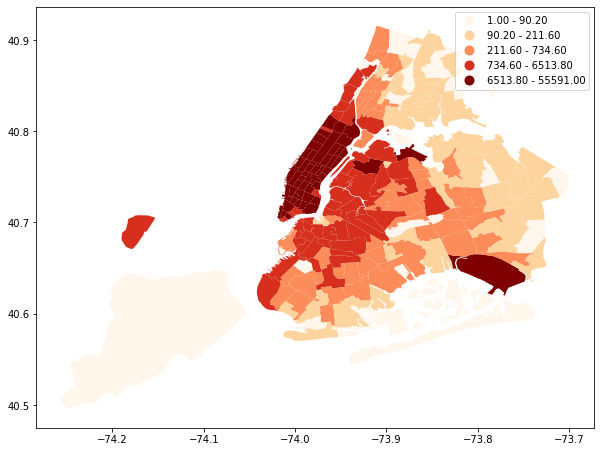

In [45]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='quantiles',
           legend=True);

## Способы классификации данных на карте

- box_plot 
- equal_interval
- fisher_jenks
- fisher_jenks_sampled
- headtail_breaks 
- jenks_caspall
- jenks_caspall_forced
- jenks_caspall_sampled 
- max_p_classifier
- maximum_breaks 
- natural_breaks
- quantiles 
- percentiles
- std_mean 
- user_defined

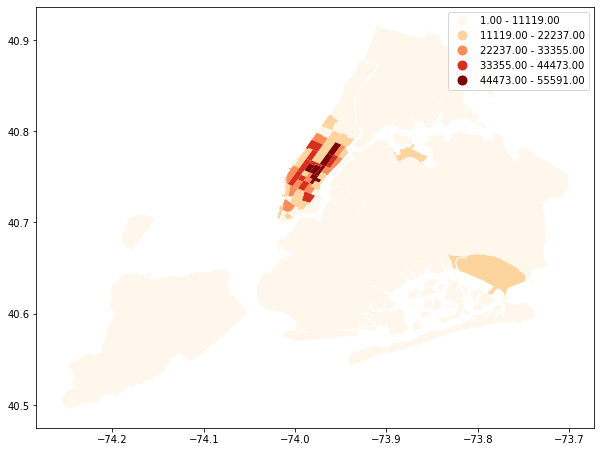

In [46]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='equal_interval',
           legend=True);

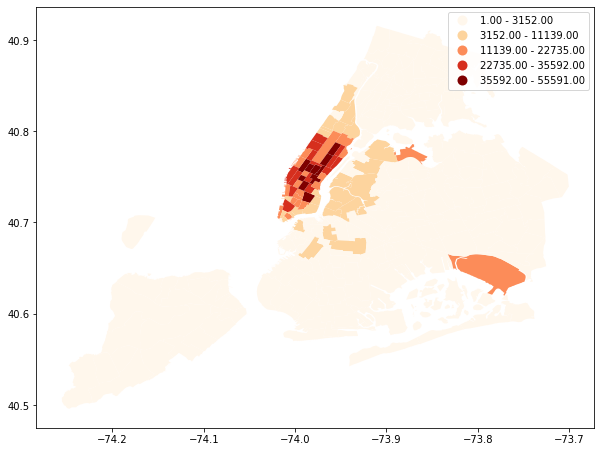

In [47]:
zones.plot('trip_count',
           figsize=(10, 15),
           cmap='OrRd', 
           scheme='fisher_jenks',
           legend=True);

In [48]:
bins = 5

zones_pd = zones.drop(labels='geometry', axis=1)

m = folium.Map(location=[40.730610, -73.935242], 
               zoom_start=11,
               tiles = "CartoDB positron")

folium.Choropleth(
    geo_data=zones,
    data=zones_pd,
    columns=['zone','trip_count'],
    key_on = 'feature.properties.zone',
    fill_color='BuPu',
    fill_opacity=0.7,
    line_opacity=0.5,
    bins=bins,
    legend_name='Trip Count'
).add_to(m)

m


## Граф улично-дорожной сети

![Image of Yaktocat](images/cities_typology_btwnss.jpg)

In [49]:
import networkx as nx
import osmnx as ox
ox.config(log_console=True, use_cache=True)
ox.__version__

'0.10'

In [50]:
%%time
G = ox.graph_from_bbox(lat_max, lat_min, lon_max, lon_min,
                        network_type='drive')

CPU times: user 53.4 s, sys: 3.06 s, total: 56.5 s
Wall time: 1min 8s


In [51]:
#G = ox.project_graph(G)

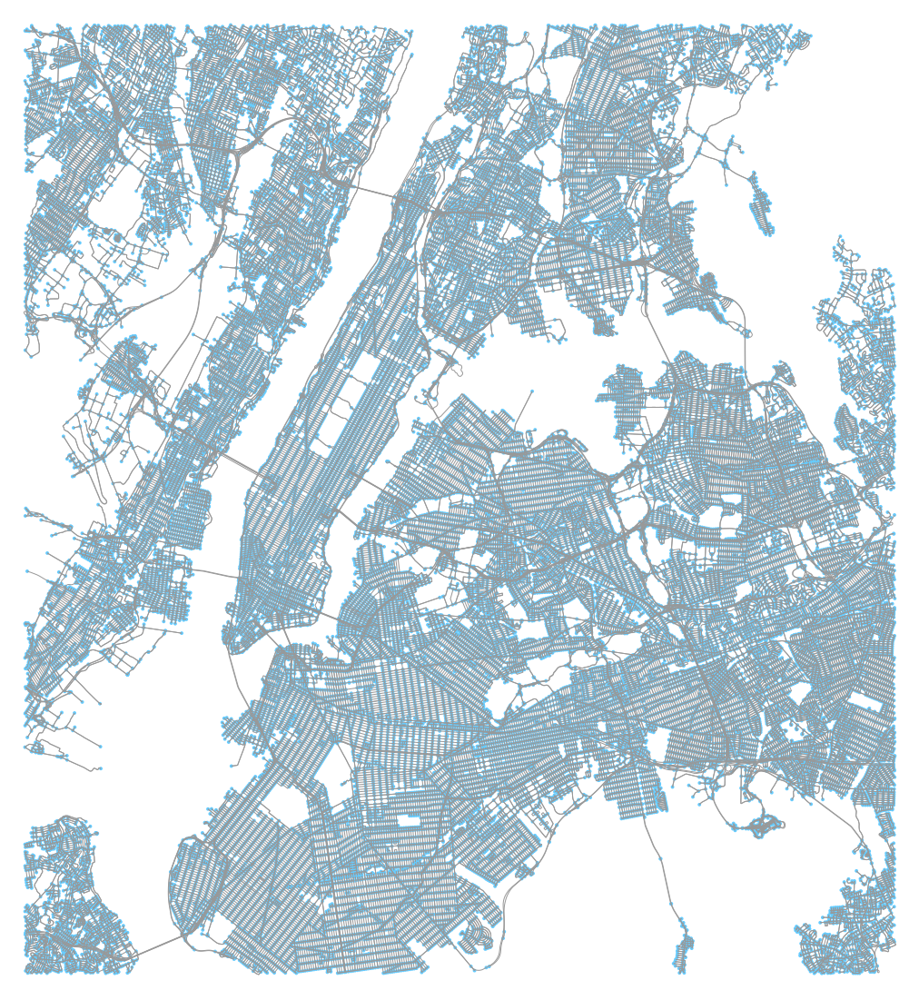

(<Figure size 1440x1440 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x186d46240>)

In [52]:
ox.plot_graph(G, fig_height=20, fig_width=20)

In [53]:
gdf_nodes = ox.graph_to_gdfs(G, edges=False)

In [54]:
gdf_nodes.tail(5)

,highway,osmid,ref,x,y,geometry
42729464,NaN,42729464,NaN,-73.906448,40.901035,POINT (-73.9064482 40.9010349)
42467323,traffic_signals,42467323,NaN,-73.937518,40.654916,POINT (-73.937518 40.654916)
42467324,traffic_signals,42467324,NaN,-73.936548,40.654976,POINT (-73.936548 40.654976)
42467325,traffic_signals,42467325,NaN,-73.935578,40.655039,POINT (-73.93557800000001 40.655039)
42860543,NaN,42860543,NaN,-73.941771,40.743831,POINT (-73.9417706 40.7438315)


### Построение оптимального маршрута

In [55]:
from sklearn.neighbors import KDTree

In [56]:
tree = KDTree(gdf_nodes[['y', 'x']], metric='euclidean')

In [57]:
def find_nearest_node(tree, gdf, point):
    
    closest_idx = tree.query([(point.y, point.x)], k=1, return_distance=False)[0]
    nearest_node = gdf.iloc[closest_idx].index.values[0]
    
    return nearest_node

In [58]:
closest_node_to_es = find_nearest_node(tree, gdf_nodes, empire_state_building['geometry'][0])

In [59]:
closest_node_to_es

42446701

In [60]:
closest_node_lo_laguardia = find_nearest_node(tree, gdf_nodes, Point(-73.872280, 40.772268))

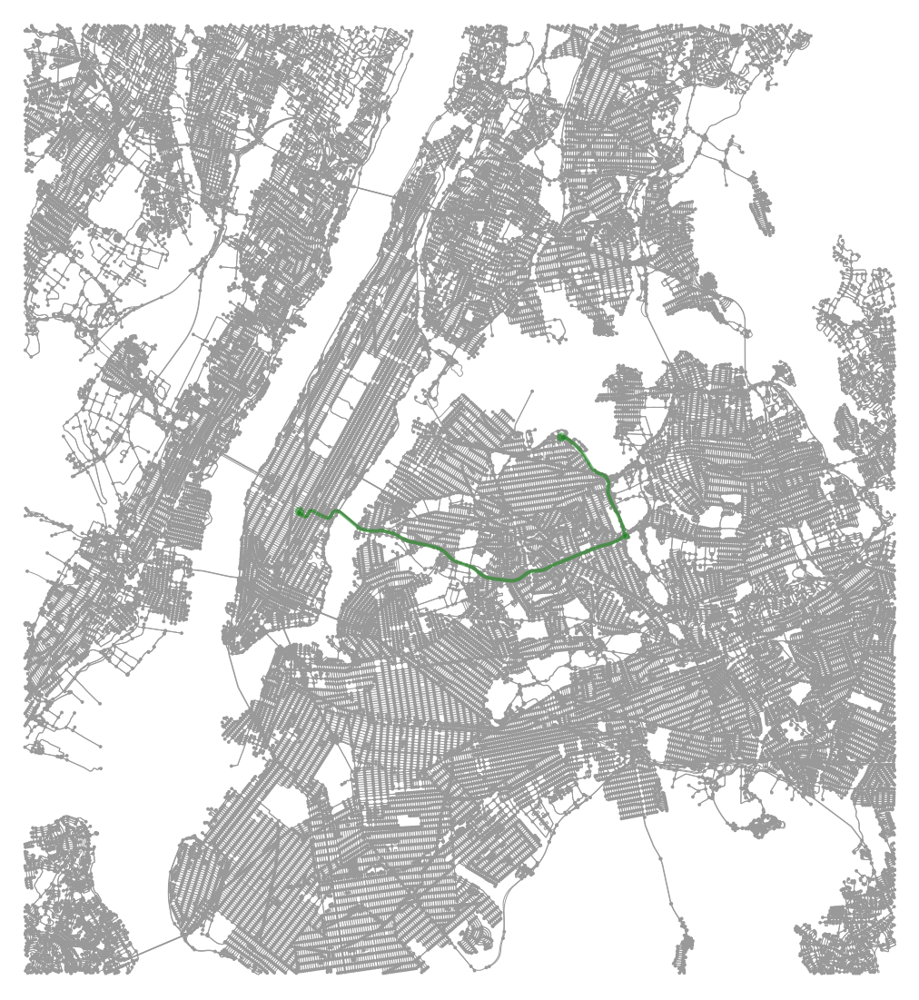

In [61]:
route = nx.shortest_path(G, closest_node_to_es, closest_node_lo_laguardia)

fig, ax = ox.plot_graph_route(G, route,
                              show=False, close=False, 
                              orig_dest_node_color='green',
                              route_color='green',
                              fig_height=20,
                              fig_width=20)

plt.show()

In [62]:
m = ox.plot_route_folium(G, 
                         route, 
                         route_color='green', route_opacity=0.7, route_width=3)
m

In [63]:
route[:5]

[42446701, 42443680, 42445899, 4597668020, 42449308]

In [64]:
ox.node_list_to_coordinate_lines(G, route)[:5]

[[(-73.985046, 40.747773), (-73.9854922, 40.747168)],
 [(-73.9854922, 40.747168),
  (-73.9851684, 40.7470315),
  (-73.9840491, 40.7465597),
  (-73.9838963, 40.7464898)],
 [(-73.9838963, 40.7464898),
  (-73.9838009, 40.7464499),
  (-73.9823187, 40.7458297)],
 [(-73.9823187, 40.7458297), (-73.9822164, 40.7457862)],
 [(-73.9822164, 40.7457862),
  (-73.9820664, 40.7459924),
  (-73.9818111, 40.7463434),
  (-73.9817748, 40.7464005)]]

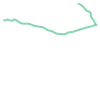

In [65]:
MultiLineString(ox.node_list_to_coordinate_lines(G, route))

In [66]:
es_buffer = empire_state_building.to_crs(epsg=3857).buffer(50)

In [67]:
gpd.GeoDataFrame(geometry=es_buffer, 
                 crs=3857).to_crs(epsg=4326)['geometry']

0    POLYGON ((-73.98454664235793 40.7481628, -73.9...
Name: geometry, dtype: object

In [68]:
%%time
matches = df.intersects(gpd.GeoDataFrame(geometry=es_buffer,
                                         crs=3857).to_crs(epsg=4326)['geometry'][0])
matches = df[matches]

CPU times: user 7.01 s, sys: 1.23 s, total: 8.24 s
Wall time: 9.22 s


In [69]:
matches.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry
1003,id3892641,1,2016-05-09 20:18:42,2016-05-09 20:26:11,1,-73.974724,40.761276,-73.984802,40.748276,N,449,POINT (-73.98480224609375 40.74827575683594)
1719,id1721766,2,2016-06-18 11:40:57,2016-06-18 11:52:45,1,-73.972290,40.763256,-73.984856,40.748264,N,708,POINT (-73.98485565185547 40.74826431274415)
2027,id3624818,2,2016-05-22 18:46:57,2016-05-22 18:54:18,1,-73.981476,40.758705,-73.984756,40.748333,N,441,POINT (-73.98475646972656 40.74833297729492)
2500,id3052943,1,2016-05-27 09:29:55,2016-05-27 09:41:49,3,-73.974792,40.761471,-73.984932,40.747921,N,714,POINT (-73.98493194580078 40.74792098999024)
2768,id1841174,2,2016-06-23 21:31:59,2016-06-23 22:15:17,1,-73.789490,40.647003,-73.984985,40.748436,N,2598,POINT (-73.9849853515625 40.74843597412109)


In [70]:
%%time
sindex = df.sindex

CPU times: user 1min 16s, sys: 1.97 s, total: 1min 18s
Wall time: 1min 25s


In [71]:
%%time
possible_matches_index = list(sindex.intersection(gpd.GeoDataFrame(geometry=es_buffer, 
                                                                   crs=3857).to_crs(epsg=4326)['geometry'][0].bounds))
possible_matches = df.iloc[possible_matches_index]

precise_matches = possible_matches[possible_matches.intersects(gpd.GeoDataFrame(geometry=es_buffer, 
                                                                                crs=3857).to_crs(epsg=4326)['geometry'][0])]

CPU times: user 93.7 ms, sys: 228 ms, total: 322 ms
Wall time: 560 ms


In [72]:
%%time
sjoin_matches = gpd.sjoin(df, gpd.GeoDataFrame(geometry=es_buffer, crs=3857).to_crs(epsg=4326))

CPU times: user 56.1 s, sys: 4.9 s, total: 1min 1s
Wall time: 1min 6s


In [73]:
len(precise_matches)

1073

In [74]:
sjoin_matches.head(2)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry,index_right
1003,id3892641,1,2016-05-09 20:18:42,2016-05-09 20:26:11,1,-73.974724,40.761276,-73.984802,40.748276,N,449,POINT (-73.98480224609375 40.74827575683594),0
1719,id1721766,2,2016-06-18 11:40:57,2016-06-18 11:52:45,1,-73.972290,40.763256,-73.984856,40.748264,N,708,POINT (-73.98485565185547 40.74826431274415),0


In [75]:
m = folium.Map(location=[40.748162, -73.9849958], 
               zoom_start=18, 
               tiles='cartodbpositron')


for i in range(0,len(precise_matches)):
    folium.Circle(
        location=[precise_matches.iloc[i]['dropoff_latitude'], 
                  precise_matches.iloc[i]['dropoff_longitude']],
        radius=5,
        stroke=False,
        fill=True,
        fill_color='purple',
        fill_opacity=0.4
   ).add_to(m)

m

In [76]:
m = folium.Map(location=[40.748162, -73.9849958], 
               zoom_start=11, 
               tiles='cartodbpositron')


for i in range(0,len(precise_matches)):
    folium.Circle(
        location=[precise_matches.iloc[i]['pickup_latitude'], 
                  precise_matches.iloc[i]['pickup_longitude']],
        radius=10,
        stroke=False,
        fill=True,
        fill_color='purple',
        fill_opacity=0.4
   ).add_to(m)

m

In [77]:
precise_matches.head(2)

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry
683232,id0044315,1,2016-02-28 04:02:57,2016-02-28 04:04:55,1,-73.981491,40.753387,-73.985413,40.748184,N,118,POINT (-73.98541259765625 40.74818420410156)
659855,id2960912,2,2016-06-17 10:06:01,2016-06-17 10:11:28,2,-73.983490,40.752869,-73.985336,40.748199,N,327,POINT (-73.98533630371094 40.74819946289063)


In [78]:
precise_matches['closest_to_pickup_node'] = [find_nearest_node(tree, 
                                                gdf_nodes, Point(x,y)) for x,y in zip(precise_matches['pickup_longitude'], 
                                                precise_matches['pickup_latitude'])]

precise_matches['closest_to_dropoff_node'] = [find_nearest_node(tree, 
                                                gdf_nodes, Point(x,y)) for x,y in zip(precise_matches['dropoff_longitude'],
                                                precise_matches['dropoff_latitude'])]

In [79]:
precise_matches[['geometry',
                 'closest_to_pickup_node', 
                 'closest_to_dropoff_node']].head(2)

,geometry,closest_to_pickup_node,closest_to_dropoff_node
683232,POINT (-73.98541259765625 40.74818420410156),42432436,42446701
659855,POINT (-73.98533630371094 40.74819946289063),42430324,42446701


In [80]:
routes = []

for row in tqdm(precise_matches.iterrows()):
    try:
        route = nx.shortest_path(G, 
                                 row[1].closest_to_pickup_node, 
                                 row[1].closest_to_dropoff_node)
        
        routes.append(MultiLineString(ox.node_list_to_coordinate_lines(G, route)))
    except:
        routes.append(Point(manhattan.centroid[0].x, manhattan.centroid[0].y))

In [81]:
precise_matches['geometry'] = routes

In [82]:
precise_matches.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,geometry,closest_to_pickup_node,closest_to_dropoff_node
683232,id0044315,1,2016-02-28 04:02:57,2016-02-28 04:04:55,1,-73.981491,40.753387,-73.985413,40.748184,N,118,"(LINESTRING (-73.98137199999999 40.752814, -73...",42432436,42446701
659855,id2960912,2,2016-06-17 10:06:01,2016-06-17 10:11:28,2,-73.983490,40.752869,-73.985336,40.748199,N,327,"(LINESTRING (-73.9850397 40.7535585, -73.98466...",42430324,42446701
81569,id3803118,1,2016-03-31 13:14:47,2016-03-31 13:20:26,1,-73.982811,40.751308,-73.985420,40.748230,N,339,"(LINESTRING (-73.982724 40.750959, -73.9831796...",42433604,42446701
884212,id0695815,2,2016-06-03 06:34:43,2016-06-03 06:44:02,5,-73.961769,40.758659,-73.985359,40.748310,N,559,"(LINESTRING (-73.96243200000001 40.758981, -73...",42456041,42446701
892529,id0373354,2,2016-03-30 15:03:30,2016-03-30 15:11:31,5,-73.985397,40.757469,-73.985336,40.748360,N,481,"(LINESTRING (-73.9855335 40.7579634, -73.98595...",42428297,42446701


In [84]:
m = folium.Map(location=[40.730610, -73.935242], 
               zoom_start=12, 
               tiles='cartodbpositron')

folium.GeoJson(precise_matches.to_json(), 
               style_function=lambda x: {'color': 'red',
                                         'opacity':'0.2',
                                         'weight':'1.5'}).add_to(m)

m